Only Yuan should make changes to this file. 

In [7]:
import pandas as pd

In [1]:
import numpy as np

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns 

In [3]:
import sys 
sys.path.append("../../")

In [4]:
from proj_mod import drop_extreme

In [5]:
from proj_mod import data_shifting

In [8]:
all_data=pd.read_csv("../../data/processed/all_data_inf_adj_collection.csv")

In [9]:
all_data.columns

Index(['Unnamed: 0', 'Date', 'fed_dff_daily',
       'ppi314_monthly_pro_change_inf_adj',
       'ppi332_monthly_pro_change_inf_adj',
       'ppi333_monthly_pro_change_inf_adj',
       'ppi334_monthly_pro_change_inf_adj',
       'ppi335_monthly_pro_change_inf_adj',
       'ppi336_monthly_pro_change_inf_adj',
       'ppi339_monthly_pro_change_inf_adj',
       'ppi516_monthly_pro_change_inf_adj',
       'ppi517_monthly_pro_change_inf_adj',
       'ppi5132_monthly_pro_change_inf_adj',
       'ppi5182_monthly_pro_change_inf_adj',
       'tech_index_20days_prior_pro_change_inf_adj',
       'cop_20days_prior_pro_change_inf_adj',
       'gold_20days_prior_pro_change_inf_adj',
       'silv_20days_prior_pro_change_inf_adj',
       'pal_20days_prior_pro_change_inf_adj',
       'plat_20days_prior_pro_change_inf_adj',
       'crude_oil_20days_prior_pro_change_inf_adj'],
      dtype='object')

In [10]:
all_data=all_data.drop("Unnamed: 0", axis=1)

In [11]:
all_data.columns

Index(['Date', 'fed_dff_daily', 'ppi314_monthly_pro_change_inf_adj',
       'ppi332_monthly_pro_change_inf_adj',
       'ppi333_monthly_pro_change_inf_adj',
       'ppi334_monthly_pro_change_inf_adj',
       'ppi335_monthly_pro_change_inf_adj',
       'ppi336_monthly_pro_change_inf_adj',
       'ppi339_monthly_pro_change_inf_adj',
       'ppi516_monthly_pro_change_inf_adj',
       'ppi517_monthly_pro_change_inf_adj',
       'ppi5132_monthly_pro_change_inf_adj',
       'ppi5182_monthly_pro_change_inf_adj',
       'tech_index_20days_prior_pro_change_inf_adj',
       'cop_20days_prior_pro_change_inf_adj',
       'gold_20days_prior_pro_change_inf_adj',
       'silv_20days_prior_pro_change_inf_adj',
       'pal_20days_prior_pro_change_inf_adj',
       'plat_20days_prior_pro_change_inf_adj',
       'crude_oil_20days_prior_pro_change_inf_adj'],
      dtype='object')

In [16]:
all_data=all_data.reindex(columns=['Date', 
       'tech_index_20days_prior_pro_change_inf_adj',
       'fed_dff_daily', 
       'ppi314_monthly_pro_change_inf_adj',
       'ppi332_monthly_pro_change_inf_adj',
       'ppi333_monthly_pro_change_inf_adj',
       'ppi334_monthly_pro_change_inf_adj',
       'ppi335_monthly_pro_change_inf_adj',
       'ppi336_monthly_pro_change_inf_adj',
       'ppi339_monthly_pro_change_inf_adj',
       'ppi516_monthly_pro_change_inf_adj',
       'ppi517_monthly_pro_change_inf_adj',
       'ppi5132_monthly_pro_change_inf_adj',
       'ppi5182_monthly_pro_change_inf_adj',
       'cop_20days_prior_pro_change_inf_adj',
       'gold_20days_prior_pro_change_inf_adj',
       'silv_20days_prior_pro_change_inf_adj',
       'pal_20days_prior_pro_change_inf_adj',
       'plat_20days_prior_pro_change_inf_adj',
       'crude_oil_20days_prior_pro_change_inf_adj'])

In [18]:
all_data.columns

Index(['Date', 'tech_index_20days_prior_pro_change_inf_adj', 'fed_dff_daily',
       'ppi314_monthly_pro_change_inf_adj',
       'ppi332_monthly_pro_change_inf_adj',
       'ppi333_monthly_pro_change_inf_adj',
       'ppi334_monthly_pro_change_inf_adj',
       'ppi335_monthly_pro_change_inf_adj',
       'ppi336_monthly_pro_change_inf_adj',
       'ppi339_monthly_pro_change_inf_adj',
       'ppi516_monthly_pro_change_inf_adj',
       'ppi517_monthly_pro_change_inf_adj',
       'ppi5132_monthly_pro_change_inf_adj',
       'ppi5182_monthly_pro_change_inf_adj',
       'cop_20days_prior_pro_change_inf_adj',
       'gold_20days_prior_pro_change_inf_adj',
       'silv_20days_prior_pro_change_inf_adj',
       'pal_20days_prior_pro_change_inf_adj',
       'plat_20days_prior_pro_change_inf_adj',
       'crude_oil_20days_prior_pro_change_inf_adj'],
      dtype='object')

In [19]:
lst_cols_shift=['tech_index_20days_prior_pro_change_inf_adj', 'fed_dff_daily',
       'ppi314_monthly_pro_change_inf_adj',
       'ppi332_monthly_pro_change_inf_adj',
       'ppi333_monthly_pro_change_inf_adj',
       'ppi334_monthly_pro_change_inf_adj',
       'ppi335_monthly_pro_change_inf_adj',
       'ppi336_monthly_pro_change_inf_adj',
       'ppi339_monthly_pro_change_inf_adj',
       'ppi516_monthly_pro_change_inf_adj',
       'ppi517_monthly_pro_change_inf_adj',
       'ppi5132_monthly_pro_change_inf_adj',
       'ppi5182_monthly_pro_change_inf_adj',
       'cop_20days_prior_pro_change_inf_adj',
       'gold_20days_prior_pro_change_inf_adj',
       'silv_20days_prior_pro_change_inf_adj',
       'pal_20days_prior_pro_change_inf_adj',
       'plat_20days_prior_pro_change_inf_adj',
       'crude_oil_20days_prior_pro_change_inf_adj']

In [20]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())
#import numpy as np
#import pandas as pd
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import roc_auc_score
from interpret.glassbox import ExplainableBoostingRegressor
from interpret import show

In [23]:
all_data

,Date,tech_index_20days_prior_pro_change_inf_adj,fed_dff_daily,ppi314_monthly_pro_change_inf_adj,ppi332_monthly_pro_change_inf_adj,ppi333_monthly_pro_change_inf_adj,ppi334_monthly_pro_change_inf_adj,ppi335_monthly_pro_change_inf_adj,ppi336_monthly_pro_change_inf_adj,ppi339_monthly_pro_change_inf_adj,ppi516_monthly_pro_change_inf_adj,ppi517_monthly_pro_change_inf_adj,ppi5132_monthly_pro_change_inf_adj,ppi5182_monthly_pro_change_inf_adj,cop_20days_prior_pro_change_inf_adj,gold_20days_prior_pro_change_inf_adj,silv_20days_prior_pro_change_inf_adj,pal_20days_prior_pro_change_inf_adj,plat_20days_prior_pro_change_inf_adj,crude_oil_20days_prior_pro_change_inf_adj
0,2014-01-02,NaN,0.08,2.446838,-0.103829,0.017017,-0.370646,-0.155464,-0.116273,-0.118845,1.594599,-0.370646,-0.478704,-0.370646,NaN,NaN,NaN,NaN,NaN,NaN
1,2014-01-03,NaN,0.08,2.446838,-0.103829,0.017017,-0.370646,-0.155464,-0.116273,-0.118845,1.594599,-0.370646,-0.478704,-0.370646,NaN,NaN,NaN,NaN,NaN,NaN
2,2014-01-06,NaN,0.08,2.446838,-0.103829,0.017017,-0.370646,-0.155464,-0.116273,-0.118845,1.594599,-0.370646,-0.478704,-0.370646,NaN,NaN,NaN,NaN,NaN,NaN
3,2014-01-07,NaN,0.07,2.446838,-0.103829,0.017017,-0.370646,-0.155464,-0.116273,-0.118845,1.594599,-0.370646,-0.478704,-0.370646,NaN,NaN,NaN,NaN,NaN,NaN
4,2014-01-08,NaN,0.07,2.446838,-0.103829,0.017017,-0.370646,-0.155464,-0.116273,-0.118845,1.594599,-0.370646,-0.478704,-0.370646,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2563,2024-10-24,2.186840,4.83,-0.668452,0.097178,0.049298,0.216057,-0.278612,0.226184,0.170434,0.823516,0.541414,0.905231,-0.102929,-2.645986,2.730603,5.925661,11.361568,3.770550,0.910874
2564,2024-10-25,2.039159,4.83,-0.668452,0.097178,0.049298,0.216057,-0.278612,0.226184,0.170434,0.823516,0.541414,0.905231,-0.102929,-6.166548,2.570648,4.807398,13.892089,1.598315,6.069282
2565,2024-10-28,2.764371,4.83,-0.668452,0.097178,0.049298,0.216057,-0.278612,0.226184,0.170434,0.823516,0.541414,0.905231,-0.102929,-4.889680,3.159984,6.734911,-98.798978,3.077340,-1.133477
2566,2024-10-29,3.462442,4.83,-0.668452,0.097178,0.049298,0.216057,-0.278612,0.226184,0.170434,0.823516,0.541414,0.905231,-0.102929,-4.224189,4.445636,9.329965,21.462597,7.277829,-1.529923


In [25]:
all_data_extended = all_data.copy(deep=True)

arr_mse_kfold_collection=[] #Each row is for one int_extend. Then for each row index zero is for the training with extreme values, and index one is for the training without extreme values. 

for int_extend in range(4): 
    if int_extend != 0: 
        for col in lst_cols_shift: 
            all_data_extended=data_shifting.shifter(df_in=all_data_extended,str_col=col,int_shift=int_extend*20)
    all_data_extended_train=all_data_extended[all_data_extended["Date"]<"2024-01-01"].dropna()
    all_data_extended_de=drop_extreme.drop_by_sort(df_in=all_data_extended.dropna(),fl_low=0.001,fl_high=0.999)
    all_data_extended_train_de=all_data_extended_de[all_data_extended["Date"]<"2024-01-01"]
    # all_data_extended_test=all_data_extended[all_data_extended["Date"]>="2024-01-01"].dropna()
    X_train=all_data_extended_train.iloc[:,2:]
    y_train=all_data_extended_train.iloc[:,1]
    X_de_train=all_data_extended_train_de.iloc[:,2:]
    y_de_train=all_data_extended_train_de.iloc[:,1]
    # X_test=all_data_extended_test.iloc[:,2:]
    # y_test=all_data_extended_test.iloc[:,1]
    ebm_pipe=Pipeline([("std",StandardScaler()),("ebm",ExplainableBoostingRegressor())])
    time_kfold=TimeSeriesSplit(n_splits=5)
    fold_mse=[]
    #First for without deleting extreme values. 
    for index_train, index_test in time_kfold.split(X_train): 
        X_tt=X_train.iloc[index_train]
        y_tt=y_train.iloc[index_train]
        X_ho=X_train.iloc[index_test]
        y_ho=y_train.iloc[index_test]
        ebm_pipe.fit(X=X_tt,y=y_tt)
        pred=ebm_pipe.predict(X=X_ho)
        error=mean_squared_error(y_pred=pred,y_true=y_ho)
        fold_mse.append(error)
    mean_error=np.mean(fold_mse)
    arr_mse_kfold_collection.append([])
    arr_mse_kfold_collection[-1].append(mean_error)
    print("mse trained on "+str(int_extend*20)+" index shifting and WITHOUT deleting extreme values is "+str(mean_error)+" with k fold.")
    fold_mse=[]
    #Then the one with deleting extreme values. 
    for index_train, index_test in time_kfold.split(X_de_train): 
        X_tt=X_de_train.iloc[index_train]
        y_tt=y_de_train.iloc[index_train]
        X_ho=X_de_train.iloc[index_test]
        y_ho=y_de_train.iloc[index_test]
        ebm_pipe.fit(X=X_tt,y=y_tt)
        pred=ebm_pipe.predict(X=X_ho)
        error=mean_squared_error(y_pred=pred,y_true=y_ho)
        fold_mse.append(error)
    mean_error=np.mean(fold_mse)
    arr_mse_kfold_collection[-1].append(mean_error)
    print("mse trained on "+str(int_extend*20)+" index shifting and WITH deleting extreme values is "+str(mean_error)+" with k fold.")
    print("\n"+"Finished training and testing for "+str(int_extend*20)+" shiftings.")

/tmp/ipykernel_128601/3907572612.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  all_data_extended_train_de=all_data_extended_de[all_data_extended["Date"]<"2024-01-01"]


mse trained on 0 index shifting and WITHOUT deleting extreme values is 39.50983801148473 with k fold.
mse trained on 0 index shifting and WITH deleting extreme values is 35.72854288059885 with k fold.

Finished training and testing for 0 shiftings.


/tmp/ipykernel_128601/3907572612.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  all_data_extended_train_de=all_data_extended_de[all_data_extended["Date"]<"2024-01-01"]


mse trained on 20 index shifting and WITHOUT deleting extreme values is 44.768229008947 with k fold.
mse trained on 20 index shifting and WITH deleting extreme values is 40.74759528842763 with k fold.

Finished training and testing for 20 shiftings.


/tmp/ipykernel_128601/3907572612.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  all_data_extended_train_de=all_data_extended_de[all_data_extended["Date"]<"2024-01-01"]


mse trained on 40 index shifting and WITHOUT deleting extreme values is 46.248342809802914 with k fold.
mse trained on 40 index shifting and WITH deleting extreme values is 45.62616518722556 with k fold.

Finished training and testing for 40 shiftings.


/tmp/ipykernel_128601/3907572612.py:11: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  all_data_extended_train_de=all_data_extended_de[all_data_extended["Date"]<"2024-01-01"]


mse trained on 60 index shifting and WITHOUT deleting extreme values is 40.34974214261681 with k fold.
mse trained on 60 index shifting and WITH deleting extreme values is 39.55588737751983 with k fold.

Finished training and testing for 60 shiftings.


This is a record that arr_mse_kfold_collection is arr_mse_kfold_collection = [[39.50983801148473, 35.72854288059885],
 [44.768229008947, 40.74759528842763],
 [46.248342809802914, 45.62616518722556],
 [40.34974214261681, 39.55588737751983]]

In [27]:
np.array(arr_mse_kfold_collection).transpose()

array([[39.50983801, 44.76822901, 46.24834281, 40.34974214],
       [35.72854288, 40.74759529, 45.62616519, 39.55588738]])

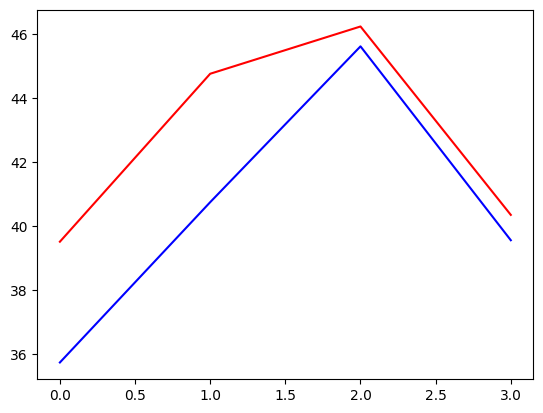

In [28]:
plt.plot(np.array(arr_mse_kfold_collection).transpose()[0], c="r")
plt.plot(np.array(arr_mse_kfold_collection).transpose()[1], c="b")
plt.show()

We should take no shifting for both with and without extreme. 

In [29]:
all_data_extended = all_data.copy(deep=True)

In [30]:
all_data_extended_train=all_data_extended[all_data_extended["Date"]<"2024-01-01"].dropna()

In [31]:
all_data_extended_de=drop_extreme.drop_by_sort(df_in=all_data_extended.dropna(),fl_low=0.001,fl_high=0.999)
all_data_extended_train_de=all_data_extended_de[all_data_extended["Date"]<"2024-01-01"]
all_data_extended_test=all_data_extended[all_data_extended["Date"]>="2024-01-01"].dropna()

/tmp/ipykernel_128601/3207107995.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  all_data_extended_train_de=all_data_extended_de[all_data_extended["Date"]<"2024-01-01"]


In [32]:
all_data_extended_test_de=all_data_extended_de[all_data_extended_de["Date"]>="2024-01-01"]

In [33]:
X_train=all_data_extended_train.iloc[:,2:]
y_train=all_data_extended_train.iloc[:,1]
X_de_train=all_data_extended_train_de.iloc[:,2:]
y_de_train=all_data_extended_train_de.iloc[:,1]
X_test=all_data_extended_test.iloc[:,2:]
y_test=all_data_extended_test.iloc[:,1]
X_de_test=all_data_extended_test_de.iloc[:,2:]
y_de_test=all_data_extended_test_de.iloc[:,1]

First the one trained without extreme values. 

In [48]:
ebm_pipe=Pipeline([("std",StandardScaler()),("ebm",ExplainableBoostingRegressor())])

In [49]:
ebm_pipe.fit(X=X_de_train,y=y_de_train)

Pipeline(steps=[('std', StandardScaler()),
                ('ebm', ExplainableBoostingRegressor())])

In [50]:
pred_extreme=ebm_pipe.predict(X=X_test)

In [51]:
pred_noextreme=ebm_pipe.predict(X_de_test)

Graph for training without extreme, test with extreme. 

In [52]:
mean_squared_error(y_pred=pred_extreme,y_true=y_test)

51.34601195965493

<function matplotlib.pyplot.show(close=None, block=None)>

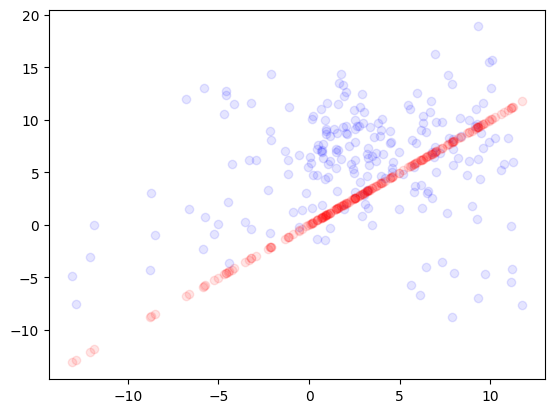

In [38]:
plt.scatter(x=y_test,y=pred_extreme,c="b",alpha=0.1)
plt.scatter(x=y_test,y=y_test,c="r",alpha=0.1)
plt.show

Graph for training without extreme, test without extreme. 

In [53]:
mean_squared_error(y_pred=pred_noextreme,y_true=y_de_test)

51.638101258083246

<function matplotlib.pyplot.show(close=None, block=None)>

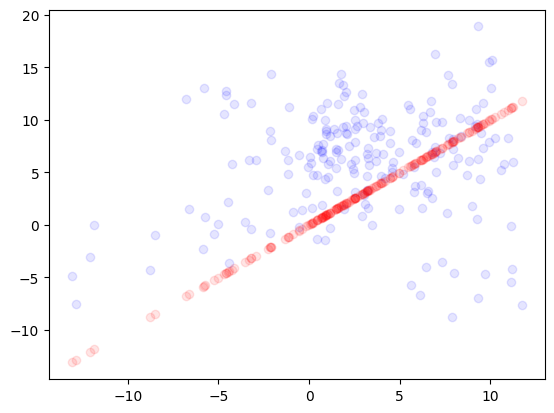

In [54]:
plt.scatter(x=y_de_test,y=pred_noextreme,c="b",alpha=0.1)
plt.scatter(x=y_de_test,y=y_de_test,c="r",alpha=0.1)
plt.show

In [40]:
show(ebm_pipe["ebm"].explain_global())

Actually not too bad if you look at the graphs. 

Then, the one trained with extreme values. 

In [55]:
ebm_pipe=Pipeline([("std",StandardScaler()),("ebm",ExplainableBoostingRegressor())])

In [56]:
ebm_pipe.fit(X=X_train,y=y_train)

Pipeline(steps=[('std', StandardScaler()),
                ('ebm', ExplainableBoostingRegressor())])

In [57]:
pred_extreme=ebm_pipe.predict(X=X_test)

In [58]:
pred_noextreme=ebm_pipe.predict(X_de_test)

The graph for training with extreme, test with extreme: 

In [59]:
mean_squared_error(y_pred=pred_extreme,y_true=y_test)

56.56588141424311

<function matplotlib.pyplot.show(close=None, block=None)>

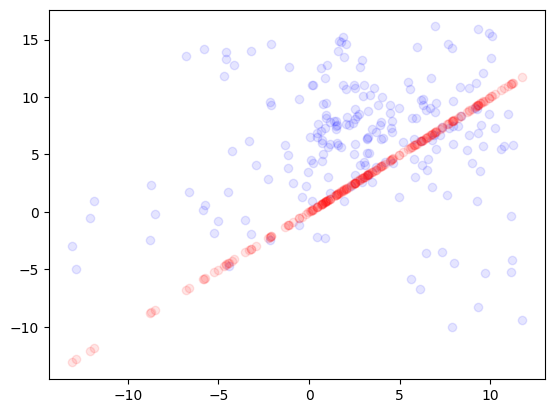

In [60]:
plt.scatter(x=y_test,y=pred_extreme,c="b",alpha=0.1)
plt.scatter(x=y_test,y=y_test,c="r",alpha=0.1)
plt.show

The graph for training with extreme, test without extreme: 

In [61]:
mean_squared_error(y_pred=pred_noextreme,y_true=y_de_test)

57.00880735359543

<function matplotlib.pyplot.show(close=None, block=None)>

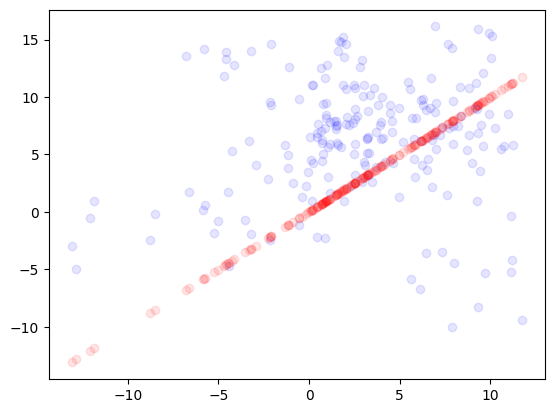

In [62]:
plt.scatter(x=y_de_test,y=pred_noextreme,c="b",alpha=0.1)
plt.scatter(x=y_de_test,y=y_de_test,c="r",alpha=0.1)
plt.show

In [47]:
show(ebm_pipe["ebm"].explain_global())

Not very bad again if you look at the graph. 